In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import imgaug.augmenters as iaa
import numpy as np
from PIL import Image
import os

# Define augmentation sequence
seq = iaa.Sequential([
    iaa.Affine(rotate=(-10, 10)),  # Rotate images by -10 to 10 degrees
    iaa.Fliplr(0.5),  # Horizontal flips with a 50% chance
    iaa.Flipud(0.5),  # Vertical flips with a 50% chance
    iaa.Affine(scale={"x": (0.9, 1.1), "y": (0.9, 1.1)}),  # Scale images by 90-110% in both x and y directions
    iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)}),  # Translate images by -10% to 10% in both x and y directions
    iaa.MultiplyBrightness((0.5, 1.5)),  # Multiply the brightness of images
    iaa.AddElementwise((-10, 10), per_channel=0.5),  # Add random values to pixels
    iaa.ElasticTransformation(alpha=(0, 10.0), sigma=(0.5, 2.0)),  # Apply elastic transformations
], random_order=True)

# Directory containing your images
image_dir = "/kaggle/input/overlapped-english-text-dataset"

# Directory to save augmented images
output_dir = "/kaggle/working/augmented_images/"

# Create output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Loop through each image in the directory
for filename in os.listdir(image_dir):
    if filename.endswith((".jpg", ".png", ".jpeg")):
        # Load the image
        image_path = os.path.join(image_dir, filename)
        image = Image.open(image_path)

        # Convert image to RGB if it's grayscale
        if image.mode != "RGB":
            image = image.convert("RGB")

        # Convert image to numpy array
        image_np = np.array(image)

        # Perform augmentation
        augmented_images = seq(images=[image_np])

        # Convert augmented images back to PIL format and save
        for i, aug_img in enumerate(augmented_images):
            aug_img_pil = Image.fromarray(aug_img)
            # Save augmented images with unique filenames
            for _ in range(9):  # Create 5 augmented images for each original image
                aug_filename = f"{os.path.splitext(filename)[0]}_aug_{i}_{_}.jpg"
                output_path = os.path.join(output_dir, aug_filename)
                aug_img_pil.save(output_path)

print("Augmentation complete.")


Augmentation complete.


In [3]:
import os

# Directory containing your augmented images
augmented_dir = "/kaggle/working/augmented_images/"

# Get the list of files in the directory
files = os.listdir(augmented_dir)

# Count the total number of files
num_images = len(files)

print("Total number of images in the augmented dataset:", num_images)


Total number of images in the augmented dataset: 1764


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step


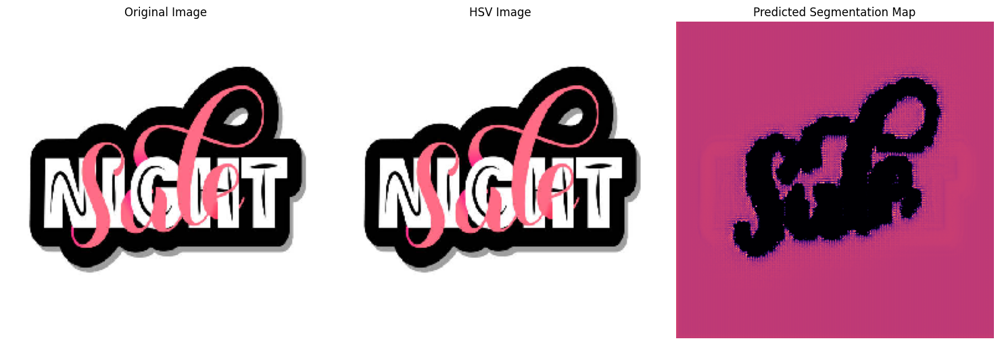

In [5]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define U-Net model
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='tanh')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Load and preprocess a single image for testing
img_path = '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg'
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

# Convert original image to HSV
img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

# Make predictions
predictions = model.predict(img_hsv)

# Convert HSV image back to RGB for displaying in Matplotlib
img_hsv_rgb = cv2.cvtColor(img_hsv[0], cv2.COLOR_HSV2RGB)

# Display the images
plt.figure(figsize=(15, 5))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# HSV Image
plt.subplot(1, 3, 2)
plt.imshow(img_hsv_rgb)
plt.title('HSV Image')
plt.axis('off')

# Predicted Segmentation Map
plt.subplot(1, 3, 3)
plt.imshow(predictions[0, :, :, 0], cmap='magma')
plt.title('Predicted Segmentation Map')
plt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


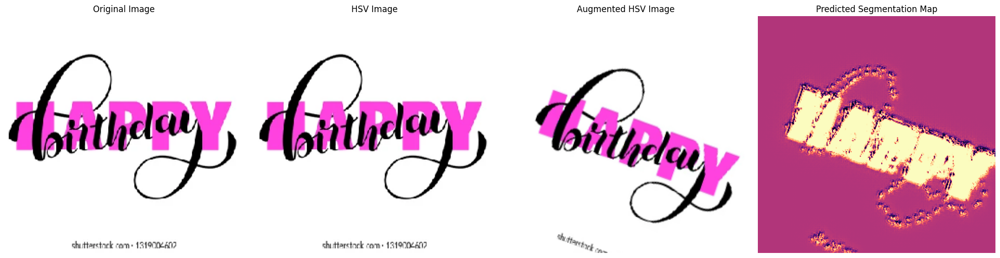

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Preprocess and augment a single image for testing
img_path = '/kaggle/input/overlapped-english-text-dataset/OD 20.png'
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

# Convert original image to HSV
img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

# Apply data augmentation
img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

# Make predictions
predictions = model.predict(img_hsv_aug)

# Convert HSV image back to RGB for displaying in Matplotlib
img_hsv_rgb = cv2.cvtColor(img_hsv[0], cv2.COLOR_HSV2RGB)
img_hsv_aug_rgb = cv2.cvtColor(img_hsv_aug[0], cv2.COLOR_HSV2RGB)

# Display the images
plt.figure(figsize=(20, 5))

# Original Image
plt.subplot(1, 4, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# HSV Image
plt.subplot(1, 4, 2)
plt.imshow(img_hsv_rgb)
plt.title('HSV Image')
plt.axis('off')

# Augmented HSV Image
plt.subplot(1, 4, 3)
plt.imshow(img_hsv_aug_rgb)
plt.title('Augmented HSV Image')
plt.axis('off')

# Predicted Segmentation Map
plt.subplot(1, 4, 4)
plt.imshow(predictions[0, :, :, 0], cmap='magma')
plt.title('Predicted Segmentation Map')
plt.axis('off')

plt.tight_layout()
plt.show()


2024-07-10 06:39:20.738546: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-10 06:39:20.738666: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-10 06:39:20.871442: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


I0000 00:00:1720593583.803178     111 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


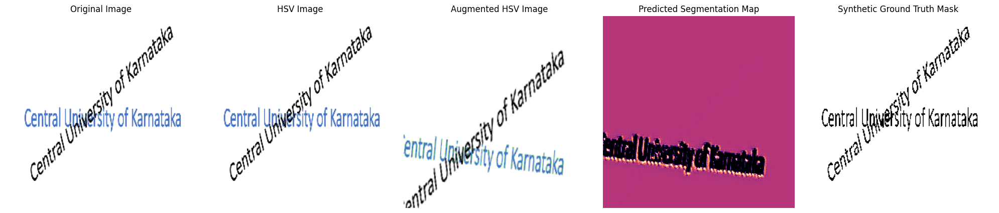

Accuracy: 0.262847900390625
Precision: 0.958219569496476
Recall: 0.24052085491608627
F1 Score: 0.38452326351730115


In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Preprocess and augment a single image for testing
img_path = '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png'
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

# Create synthetic ground truth mask
gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
_, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

# Convert original image to HSV
img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

# Apply data augmentation
img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

# Make predictions
predictions = model.predict(img_hsv_aug)

# Convert HSV image back to RGB for displaying in Matplotlib
img_hsv_rgb = cv2.cvtColor(img_hsv[0], cv2.COLOR_HSV2RGB)
img_hsv_aug_rgb = cv2.cvtColor(img_hsv_aug[0], cv2.COLOR_HSV2RGB)

# Calculate accuracy
predicted_mask = predictions[0, :, :, 0]
predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)

# Display the images
plt.figure(figsize=(20, 5))

# Original Image
plt.subplot(1, 5, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# HSV Image
plt.subplot(1, 5, 2)
plt.imshow(img_hsv_rgb)
plt.title('HSV Image')
plt.axis('off')

# Augmented HSV Image
plt.subplot(1, 5, 3)
plt.imshow(img_hsv_aug_rgb)
plt.title('Augmented HSV Image')
plt.axis('off')

# Predicted Segmentation Map
plt.subplot(1, 5, 4)
plt.imshow(predicted_mask, cmap='magma')
plt.title('Predicted Segmentation Map')
plt.axis('off')

# Synthetic Ground Truth Mask
plt.subplot(1, 5, 5)
plt.imshow(ground_truth_mask_binary, cmap='gray')
plt.title('Synthetic Ground Truth Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

# Compute the confusion matrix
# cm = confusion_matrix(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
# cm_display = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
# plt.title('Confusion Matrix')
# plt.xlabel('Predicted Label')
# plt.ylabel('True Label')
# plt.show()

# Compute precision, recall, and F1 score
precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


2024-07-04 12:34:53.033270: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-04 12:34:53.033432: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-04 12:34:53.177618: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step


I0000 00:00:1720096515.571778     102 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


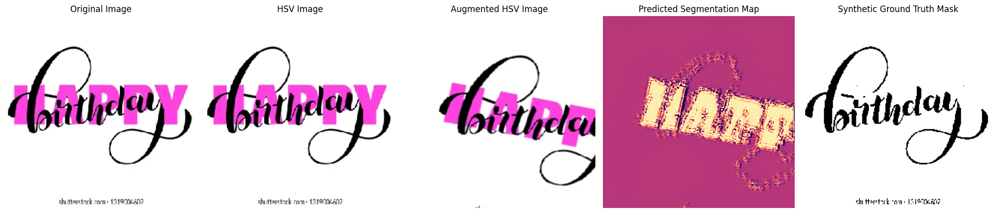

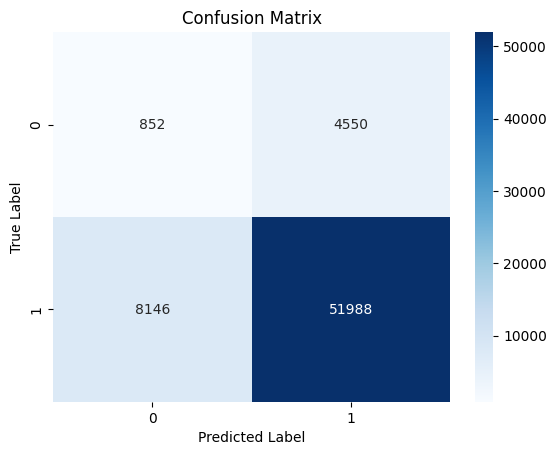

Accuracy: 0.8062744140625
Precision: 0.919523152569953
Recall: 0.8645358698905777
F1 Score: 0.8911821173889193


In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Preprocess and augment a single image for testing
img_path = '/kaggle/input/overlapped-english-text-dataset/OD 20.png'
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

# Create synthetic ground truth mask
gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
_, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

# Convert original image to HSV
img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

# Apply data augmentation
img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

# Make predictions
predictions = model.predict(img_hsv_aug)

# Convert HSV image back to RGB for displaying in Matplotlib
img_hsv_rgb = cv2.cvtColor(img_hsv[0], cv2.COLOR_HSV2RGB)
img_hsv_aug_rgb = cv2.cvtColor(img_hsv_aug[0], cv2.COLOR_HSV2RGB)

# Calculate accuracy
predicted_mask = predictions[0, :, :, 0]
predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)

# Display the images
plt.figure(figsize=(20, 5))

# Original Image
plt.subplot(1, 5, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# HSV Image
plt.subplot(1, 5, 2)
plt.imshow(img_hsv_rgb)
plt.title('HSV Image')
plt.axis('off')

# Augmented HSV Image
plt.subplot(1, 5, 3)
plt.imshow(img_hsv_aug_rgb)
plt.title('Augmented HSV Image')
plt.axis('off')

# Predicted Segmentation Map
plt.subplot(1, 5, 4)
plt.imshow(predicted_mask, cmap='magma')
plt.title('Predicted Segmentation Map')
plt.axis('off')

# Synthetic Ground Truth Mask
plt.subplot(1, 5, 5)
plt.imshow(ground_truth_mask_binary, cmap='gray')
plt.title('Synthetic Ground Truth Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

# Compute the confusion matrix
cm = confusion_matrix(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
cm_display = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Compute precision, recall, and F1 score
precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


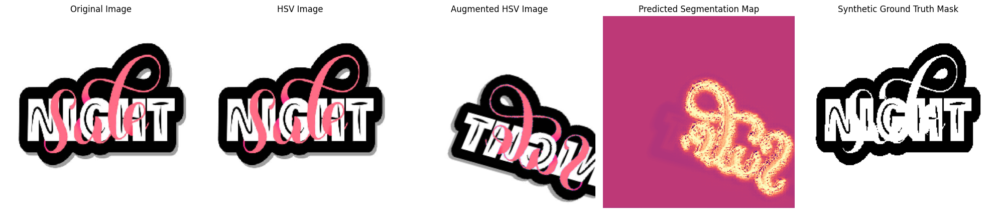

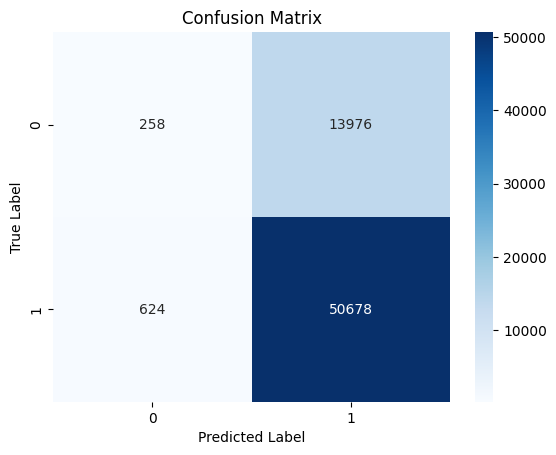

Accuracy: 0.7772216796875
Precision: 0.7838339468555696
Recall: 0.987836731511442
F1 Score: 0.8740901721342578


In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Preprocess and augment a single image for testing
img_path = '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg'
img = image.load_img(img_path, target_size=(256, 256))
img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

# Create synthetic ground truth mask
gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
_, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

# Convert original image to HSV
img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

# Apply data augmentation
img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

# Make predictions
predictions = model.predict(img_hsv_aug)

# Convert HSV image back to RGB for displaying in Matplotlib
img_hsv_rgb = cv2.cvtColor(img_hsv[0], cv2.COLOR_HSV2RGB)
img_hsv_aug_rgb = cv2.cvtColor(img_hsv_aug[0], cv2.COLOR_HSV2RGB)

# Calculate accuracy
predicted_mask = predictions[0, :, :, 0]
predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)

# Display the images
plt.figure(figsize=(20, 5))

# Original Image
plt.subplot(1, 5, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

# HSV Image
plt.subplot(1, 5, 2)
plt.imshow(img_hsv_rgb)
plt.title('HSV Image')
plt.axis('off')

# Augmented HSV Image
plt.subplot(1, 5, 3)
plt.imshow(img_hsv_aug_rgb)
plt.title('Augmented HSV Image')
plt.axis('off')

# Predicted Segmentation Map
plt.subplot(1, 5, 4)
plt.imshow(predicted_mask, cmap='magma')
plt.title('Predicted Segmentation Map')
plt.axis('off')

# Synthetic Ground Truth Mask
plt.subplot(1, 5, 5)
plt.imshow(ground_truth_mask_binary, cmap='gray')
plt.title('Synthetic Ground Truth Mask')
plt.axis('off')

plt.tight_layout()
plt.show()

# Compute the confusion matrix
cm = confusion_matrix(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
cm_display = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# Compute precision, recall, and F1 score
precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)


2024-07-06 06:07:20.434407: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-06 06:07:20.434510: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-06 06:07:20.620187: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


I0000 00:00:1720246064.938571     103 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Average Accuracy: 0.1850189208984375
Average Precision: 0.720792229875096
Average Recall: 0.02661858263019089
Average F1 Score: 0.049935219857359534


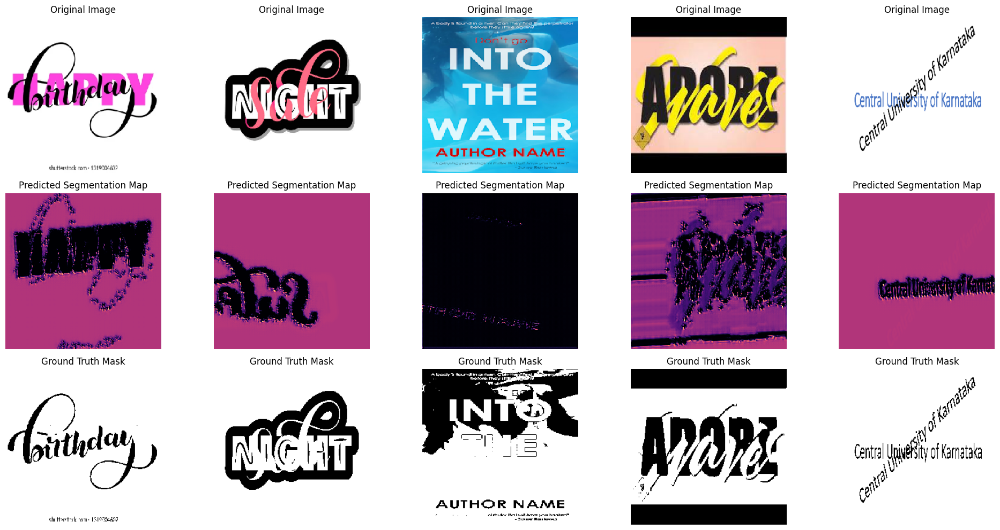

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary

# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []

# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)

# Calculate average metrics
average_accuracy = np.mean(accuracies)
average_precision = np.mean(precisions)
average_recall = np.mean(recalls)
average_f1_score = np.mean(f1_scores)

print("Average Accuracy:", average_accuracy)
print("Average Precision:", average_precision)
print("Average Recall:", average_recall)
print("Average F1 Score:", average_f1_score)

# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Metrics for /kaggle/input/overlapped-english-text-dataset/OD 20.png:
  Accuracy: 0.845062255859375
  Precision: 0.926712656239328
  Recall: 0.9025177104466691
  F1 Score: 0.9144551719489799

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 21.jpg:
  Accuracy: 0.715728759765625
  Precision: 0.7852652533789684
  Recall: 0.8765545202916065
  F1 Score: 0.8284024758676589

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 34.png:
  Accuracy: 0.6754150390625
  Precision: 0.6786491534056707
  Recall: 0.9898246324936404
  F1 Score: 0.8052193022616977

Metrics for /kaggle/input/overlapped-english-text

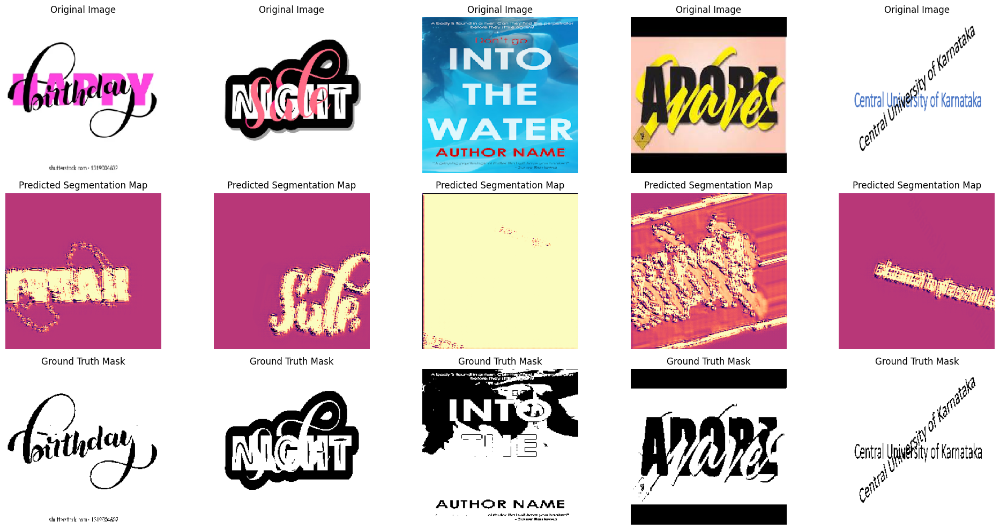

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary

# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []

# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)

# Print individual metrics for each image
for i, img_path in enumerate(image_paths):
    print(f"Metrics for {img_path}:")
    print(f"  Accuracy: {accuracies[i]}")
    print(f"  Precision: {precisions[i]}")
    print(f"  Recall: {recalls[i]}")
    print(f"  F1 Score: {f1_scores[i]}")
    print("")

# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Metrics for /kaggle/input/overlapped-english-text-dataset/OD 20.png:
  Accuracy: 0.811248779296875
  Precision: 0.9303373216087646
  Recall: 0.858582499085376
  F1 Score: 0.8930208423419528

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 21.jpg:
  Accuracy: 0.714691162109375
  Precision: 0.7888377037562013
  Recall: 0.8678414096916299
  F1 Score: 0.8264557925414416

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 34.png:
  Accuracy: 0.65911865234375
  Precision: 0.673290326631194
  Recall: 0.9656693906035434
  F1 Score: 0.7934006584544816

Metrics for /kaggle/input/overlapped-english-text

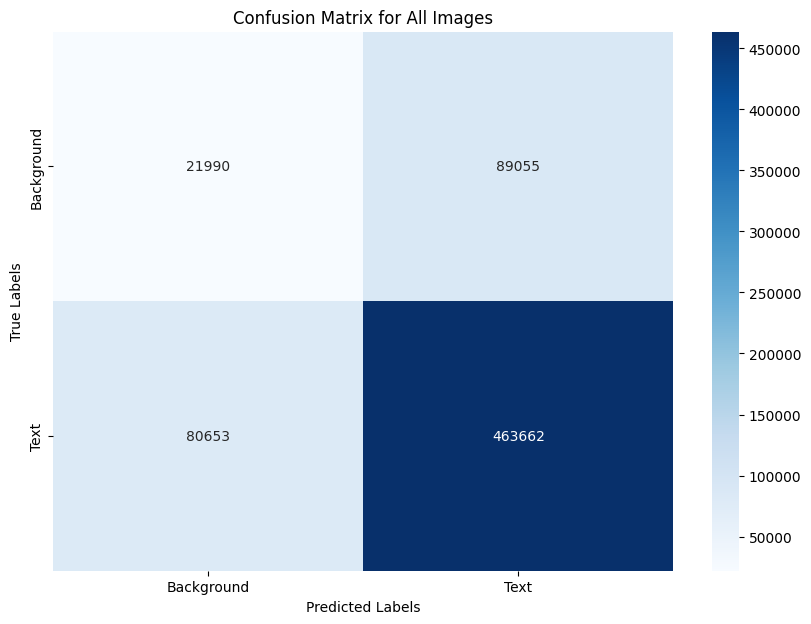

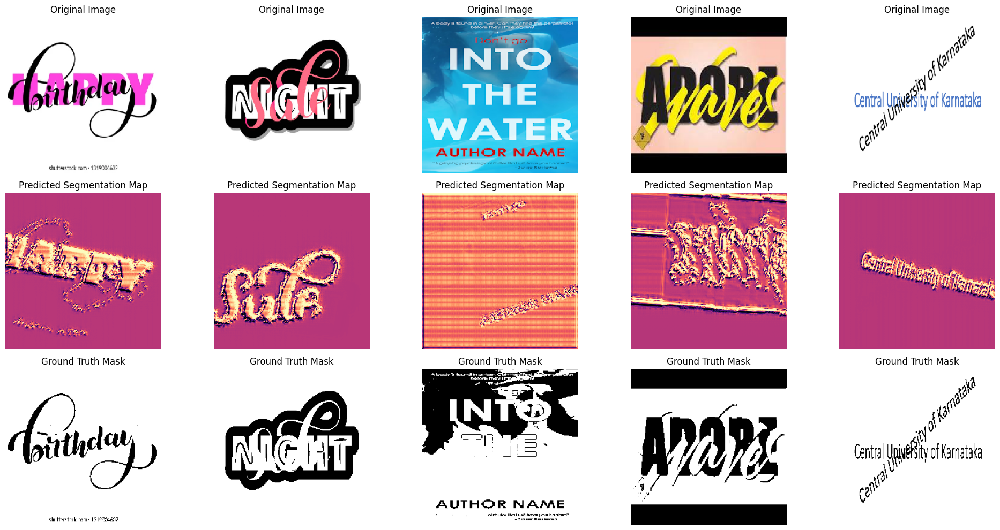

In [3]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten()

# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []
all_ground_truths = []
all_predictions = []

# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_flat, predicted_flat = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)
    all_ground_truths.extend(ground_truth_flat)
    all_predictions.extend(predicted_flat)

# Print individual metrics for each image
for i, img_path in enumerate(image_paths):
    print(f"Metrics for {img_path}:")
    print(f"  Accuracy: {accuracies[i]}")
    print(f"  Precision: {precisions[i]}")
    print(f"  Recall: {recalls[i]}")
    print(f"  F1 Score: {f1_scores[i]}")
    print("")

# Compute confusion matrix for all images
conf_matrix = confusion_matrix(all_ground_truths, all_predictions)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Background', 'Text'], yticklabels=['Background', 'Text'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for All Images')
plt.show()

# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()


2024-07-08 14:46:48.785701: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-08 14:46:48.785794: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-08 14:46:48.871163: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


I0000 00:00:1720450030.595870     105 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Metrics for /kaggle/input/overlapped-english-text-dataset/OD 20.png:
  Accuracy: 0.27294921875
  Precision: 0.8914597441685478
  Recall: 0.23642199088701898
  F1 Score: 0.37372834573223623

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 21.jpg:
  Accuracy: 0.3051605224609375
  Precision: 0.7327036409138613
  Recall: 0.17691318077267942
  F1 Score: 0.28500997032454584

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 34.png:
  Accuracy: 0.3275299072265625
  Precision: 0.8113879003558719
  Recall: 0.010265415006415885
  F1 Score: 0.020274325856434655

Metrics for /kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg:
  Accuracy: 0.459625244140625
  Preci

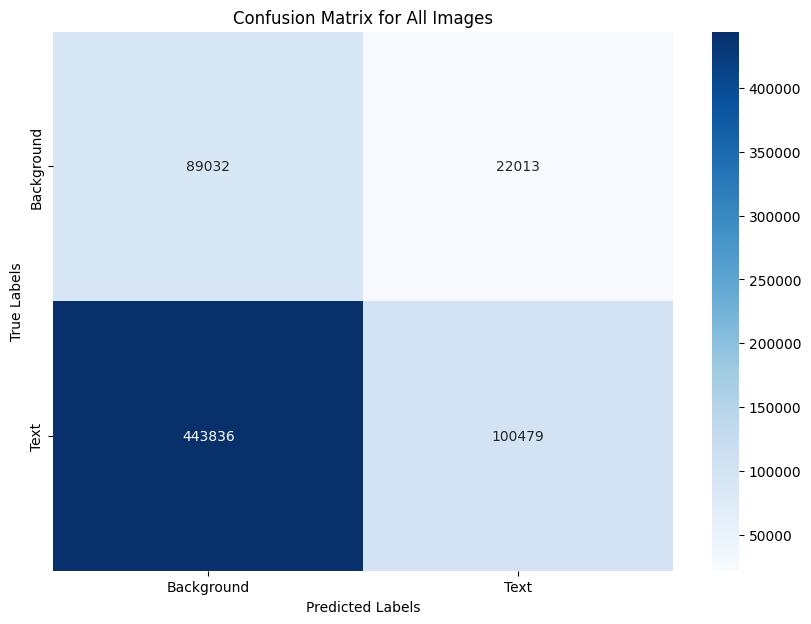

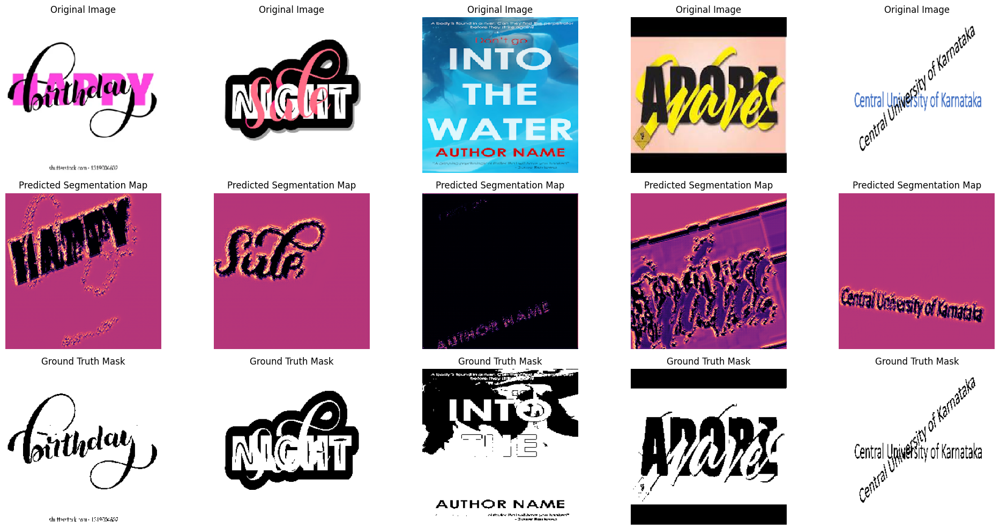

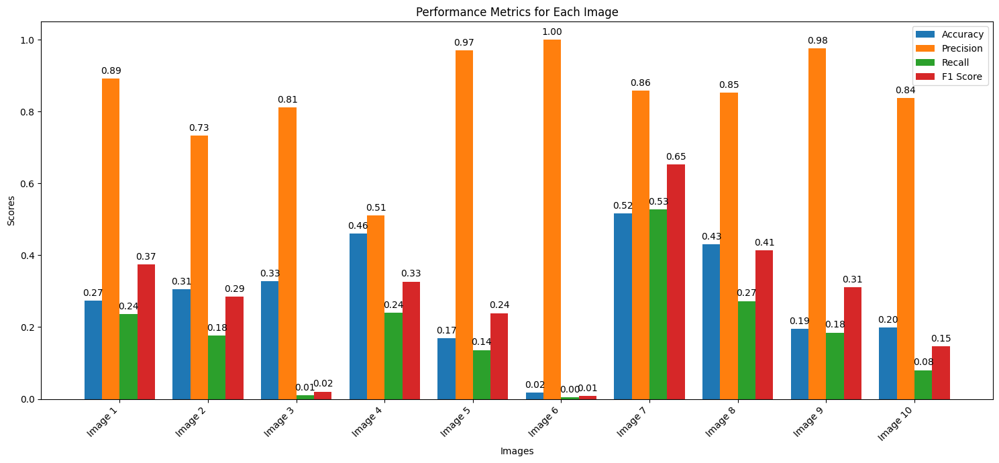

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten()

# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []
all_ground_truths = []
all_predictions = []

# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_flat, predicted_flat = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)
    all_ground_truths.extend(ground_truth_flat)
    all_predictions.extend(predicted_flat)

# Print individual metrics for each image
for i, img_path in enumerate(image_paths):
    print(f"Metrics for {img_path}:")
    print(f"  Accuracy: {accuracies[i]}")
    print(f"  Precision: {precisions[i]}")
    print(f"  Recall: {recalls[i]}")
    print(f"  F1 Score: {f1_scores[i]}")
    print("")

# Compute confusion matrix for all images
conf_matrix = confusion_matrix(all_ground_truths, all_predictions)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Background', 'Text'], yticklabels=['Background', 'Text'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for All Images')
plt.show()

# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Drawing bar plot for metrics
labels = [f'Image {i+1}' for i in range(len(image_paths))]

x = np.arange(len(labels))  # the label locations
width = 0.2  # the width of the bars

fig, ax = plt.subplots(figsize=(15, 7))
rects1 = ax.bar(x - 1.5*width, accuracies, width, label='Accuracy')
rects2 = ax.bar(x - 0.5*width, precisions, width, label='Precision')
rects3 = ax.bar(x + 0.5*width, recalls, width, label='Recall')
rects4 = ax.bar(x + 1.5*width, f1_scores, width, label='F1 Score')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Images')
ax.set_ylabel('Scores')
ax.set_title('Performance Metrics for Each Image')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45, ha='right')
ax.legend()

# Function to add labels on top of bars
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)
add_labels(rects3)
add_labels(rects4)

fig.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Metrics for /kaggle/input/overlapped-english-text-dataset/OD 20.png:
  Accuracy: 0.186370849609375
  Precision: 0.8935752253293274
  Recall: 0.12859613529783484
  F1 Score: 0.22483572716171427

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 21.jpg:
  Accuracy: 0.234954833984375
  Precision: 0.5788617886178862
  Recall: 0.0832716073447429
  F1 Score: 0.14559830953273575

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 34.png:
  Accuracy: 0.3333587646484375
  Precision: 0.7379713914174252
  Recall: 0.02555097814096936
  F1 Score: 0.0493918492569464

Metrics for /kaggle/input/overlapped-engl

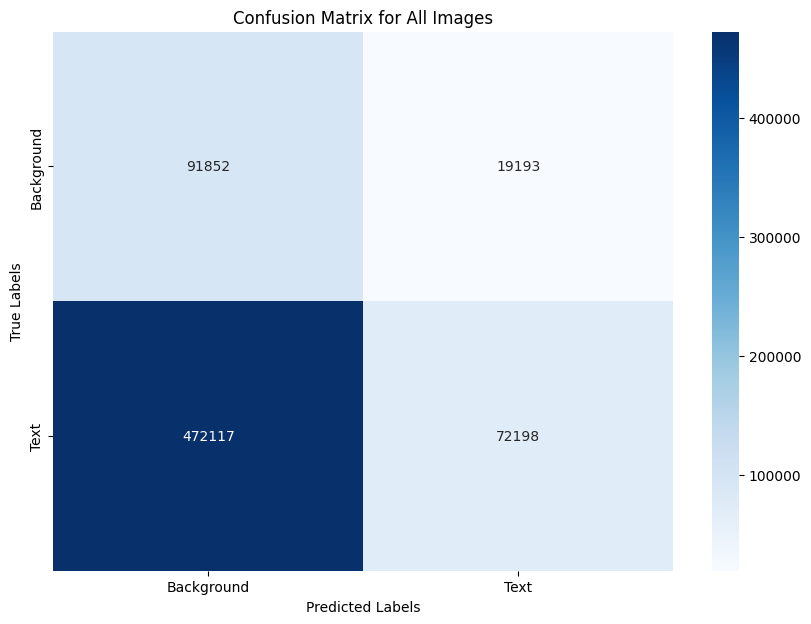

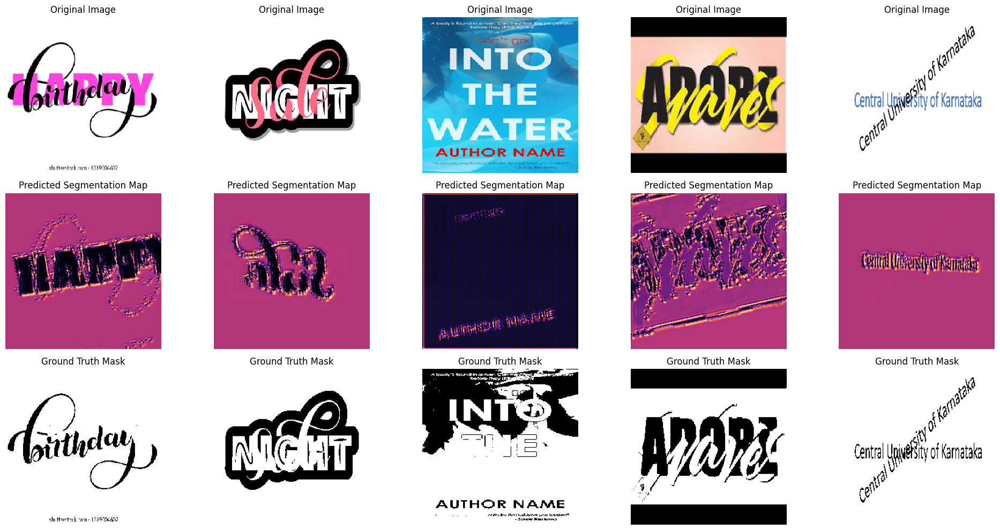

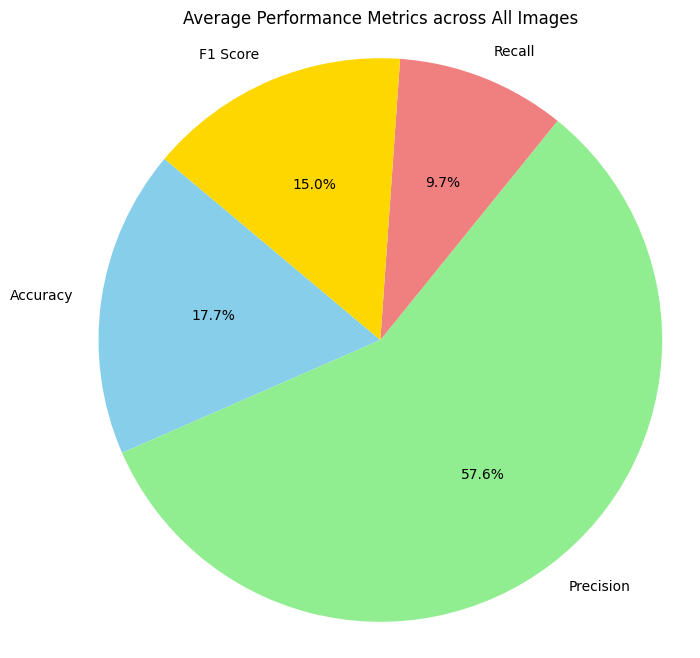

In [2]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten()

# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []
all_ground_truths = []
all_predictions = []

# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_flat, predicted_flat = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)
    all_ground_truths.extend(ground_truth_flat)
    all_predictions.extend(predicted_flat)

# Print individual metrics for each image
for i, img_path in enumerate(image_paths):
    print(f"Metrics for {img_path}:")
    print(f"  Accuracy: {accuracies[i]}")
    print(f"  Precision: {precisions[i]}")
    print(f"  Recall: {recalls[i]}")
    print(f"  F1 Score: {f1_scores[i]}")
    print("")

# Compute confusion matrix for all images
conf_matrix = confusion_matrix(all_ground_truths, all_predictions)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Background', 'Text'], yticklabels=['Background', 'Text'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for All Images')
plt.show()

# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Calculate average metrics across all images
avg_accuracy = np.mean(accuracies)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_f1_score = np.mean(f1_scores)

# Labels and corresponding metrics for the pie chart
labels = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
metrics = [avg_accuracy, avg_precision, avg_recall, avg_f1_score]

# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(metrics, labels=labels, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'lightcoral', 'gold'])
plt.title('Average Performance Metrics across All Images')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()



In [1]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import seaborn as sns

2024-07-09 13:23:23.643702: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-09 13:23:23.643863: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-09 13:23:23.762313: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Define U-Net model with Batch Normalization
def unet(input_shape=(256, 256, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = layers.BatchNormalization()(conv1)
    conv1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = layers.BatchNormalization()(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = layers.BatchNormalization()(conv2)
    conv2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = layers.BatchNormalization()(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = layers.BatchNormalization()(conv3)
    conv3 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = layers.BatchNormalization()(conv3)
    pool3 = layers.MaxPooling2D(pool_size=(2, 2))(conv3)

    # Bottleneck
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = layers.BatchNormalization()(conv4)
    conv4 = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = layers.BatchNormalization()(conv4)

    # Decoder
    up5 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv4)
    concat5 = layers.concatenate([up5, conv3], axis=-1)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(concat5)
    conv5 = layers.BatchNormalization()(conv5)
    conv5 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = layers.BatchNormalization()(conv5)

    up6 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv5)
    concat6 = layers.concatenate([up6, conv2], axis=-1)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(concat6)
    conv6 = layers.BatchNormalization()(conv6)
    conv6 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
    conv6 = layers.BatchNormalization()(conv6)

    up7 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv6)
    concat7 = layers.concatenate([up7, conv1], axis=-1)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(concat7)
    conv7 = layers.BatchNormalization()(conv7)
    conv7 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
    conv7 = layers.BatchNormalization()(conv7)

    # Output layer
    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(conv7)

    model = models.Model(inputs=inputs, outputs=outputs)
    return model

In [3]:
# Create the U-Net model
model = unet()

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [4]:
# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [5]:
# Function to process and evaluate a single image
def process_image(img_path, model, datagen):
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img) / 255.0  # Normalize pixel values

    # Create synthetic ground truth mask
    gray_img = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY)
    _, synthetic_mask = cv2.threshold(gray_img, 0.5, 1, cv2.THRESH_BINARY)

    # Convert original image to HSV
    img_hsv = cv2.cvtColor(img_array, cv2.COLOR_RGB2HSV)
    img_hsv = np.expand_dims(img_hsv, axis=0)  # Expand dimensions to match model input

    # Apply data augmentation
    img_hsv_aug = next(datagen.flow(img_hsv, batch_size=1))[0]
    img_hsv_aug = np.expand_dims(img_hsv_aug, axis=0)  # Ensure the input shape is correct

    # Make predictions
    predictions = model.predict(img_hsv_aug)

    # Calculate accuracy
    predicted_mask = predictions[0, :, :, 0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)
    ground_truth_mask_binary = (synthetic_mask > 0.5).astype(np.uint8)

    accuracy = np.mean(predicted_mask_binary == ground_truth_mask_binary)
    precision = precision_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    recall = recall_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())
    f1 = f1_score(ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten())

    return accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_mask_binary.flatten(), predicted_mask_binary.flatten()


In [6]:
# List of image paths (provide your 10 image paths here)
image_paths = [
    '/kaggle/input/overlapped-english-text-dataset/OD 20.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 21.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD 34.png',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 3.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 101.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 104.png',
    '/kaggle/input/overlapped-english-text-dataset/OD 116.jpg',
    '/kaggle/input/overlapped-english-text-dataset/OD10.jpg',
    '/kaggle/input/overlapped-english-text-dataset/overlapped 4.png'
]

In [7]:
# Create lists to store metrics and images for visualization
accuracies = []
precisions = []
recalls = []
f1_scores = []
original_images = []
predicted_masks = []
ground_truth_masks = []
all_ground_truths = []
all_predictions = []

In [8]:
# Process each image and store the metrics
for img_path in image_paths:
    accuracy, precision, recall, f1, img_array, predicted_mask, ground_truth_mask_binary, ground_truth_flat, predicted_flat = process_image(img_path, model, datagen)
    accuracies.append(accuracy)
    precisions.append(precision)
    recalls.append(recall)
    f1_scores.append(f1)
    original_images.append(img_array)
    predicted_masks.append(predicted_mask)
    ground_truth_masks.append(ground_truth_mask_binary)
    all_ground_truths.extend(ground_truth_flat)
    all_predictions.extend(predicted_flat)

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


I0000 00:00:1720531569.028981     106 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


In [9]:
# Print individual metrics for each image
for i, img_path in enumerate(image_paths):
    print(f"Metrics for {img_path}:")
    print(f"  Accuracy: {accuracies[i]}")
    print(f"  Precision: {precisions[i]}")
    print(f"  Recall: {recalls[i]}")
    print(f"  F1 Score: {f1_scores[i]}")
    print("")

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 20.png:
  Accuracy: 0.1097259521484375
  Precision: 0.8369114877589454
  Recall: 0.03695080985798384
  F1 Score: 0.07077672840784213

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 21.jpg:
  Accuracy: 0.243865966796875
  Precision: 0.6941359395824078
  Recall: 0.060913804530037814
  F1 Score: 0.11199913984660598

Metrics for /kaggle/input/overlapped-english-text-dataset/OD 34.png:
  Accuracy: 0.3294677734375
  Precision: 0.826265389876881
  Recall: 0.013597172508498232
  F1 Score: 0.02675407512402551

Metrics for /kaggle/input/overlapped-english-text-dataset/overlapped 1.jpeg:
  Accuracy: 0.4231719970703125
  Precision: 0.36000556637907044
  Recall: 0.07228074096839987
  F1 Score: 0.12038997603369243

Metrics for /kaggle/input/overlapped-english-text-dataset/overlapped 3.png:
  Accuracy: 0.0623626708984375
  Precision: 0.8959608323133414
  Recall: 0.02333328020655691
  F1 Score: 0.04548208211007037

Metrics for 

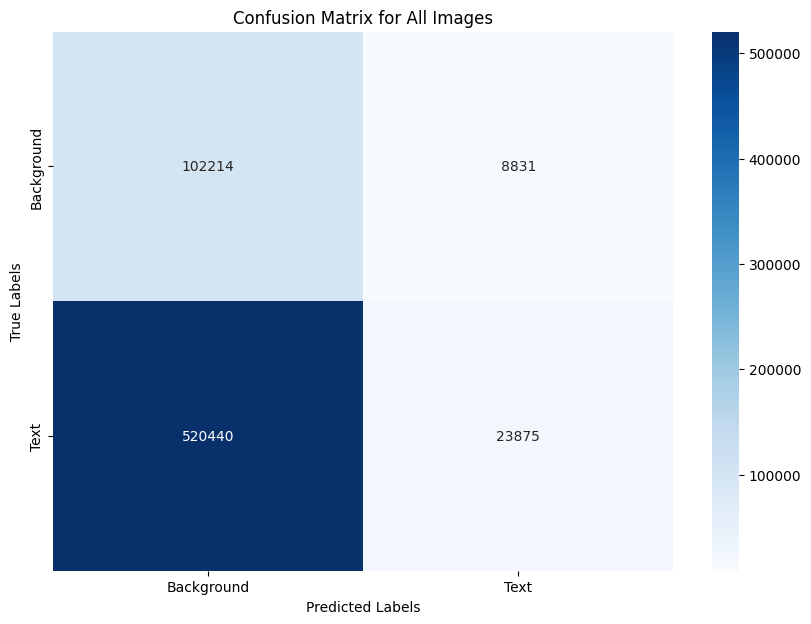

In [10]:
# Compute confusion matrix for all images
conf_matrix = confusion_matrix(all_ground_truths, all_predictions)
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Background', 'Text'], yticklabels=['Background', 'Text'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for All Images')
plt.show()

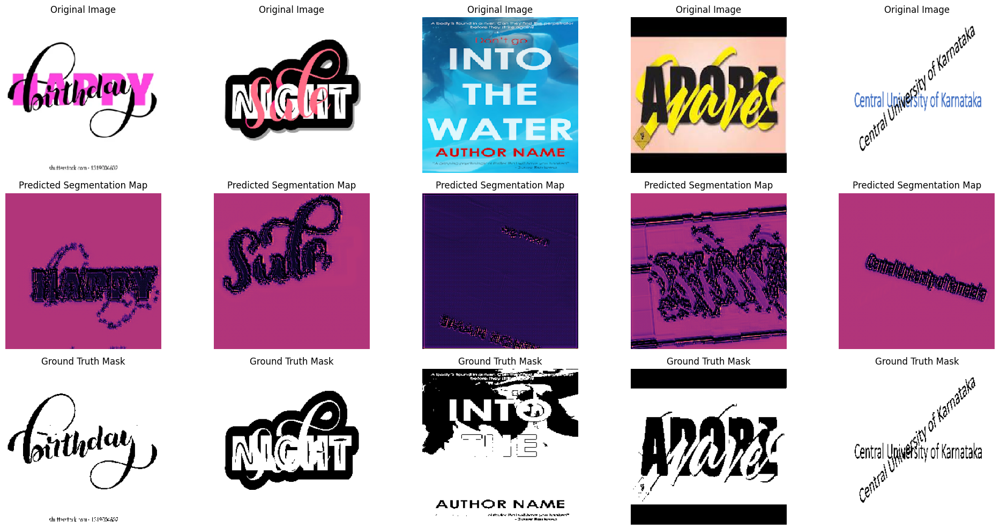

In [11]:
# Display the first 5 images with their predicted and ground truth masks
plt.figure(figsize=(20, 10))
for i in range(min(5, len(image_paths))):
    plt.subplot(3, 5, i + 1)
    plt.imshow(original_images[i])
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(3, 5, i + 6)
    plt.imshow(predicted_masks[i], cmap='magma')
    plt.title('Predicted Segmentation Map')
    plt.axis('off')

    plt.subplot(3, 5, i + 11)
    plt.imshow(ground_truth_masks[i], cmap='gray')
    plt.title('Ground Truth Mask')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [12]:
# Calculate average metrics across all images
avg_accuracy = np.mean(accuracies)
avg_precision = np.mean(precisions)
avg_recall = np.mean(recalls)
avg_f1_score = np.mean(f1_scores)

# Labels and corresponding metrics for the pie chart
labels = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
metrics = [avg_accuracy, avg_precision, avg_recall, avg_f1_score]

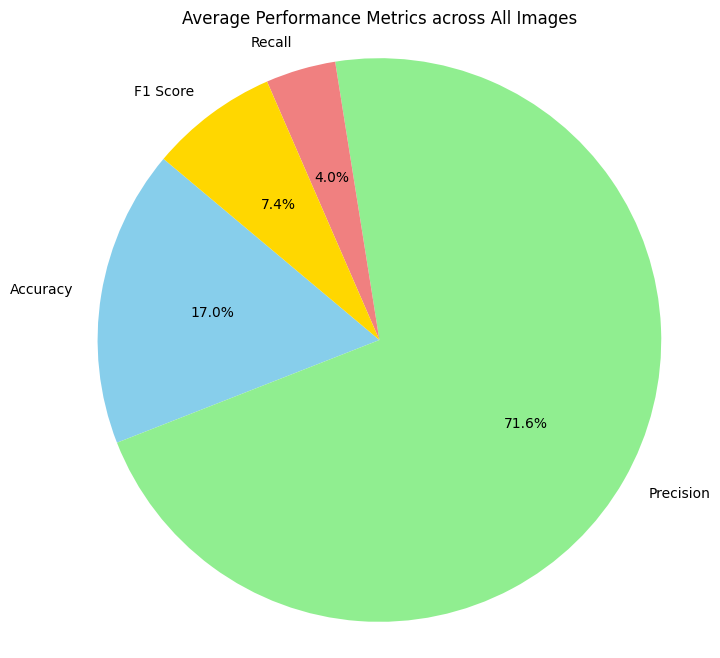

In [13]:
# Plotting the pie chart
plt.figure(figsize=(8, 8))
plt.pie(metrics, labels=labels, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'lightcoral', 'gold'])
plt.title('Average Performance Metrics across All Images')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()